# BubbleFence: ZOD Driving Demo

BubbleFence constructs **bounded semantic regions** ("bubbles") in a foundation-model
embedding space to split streaming video data into train / val / test sets that are
semantically coherent and persist across ingestion rounds.

This notebook runs the full pipeline on dashcam sequences from the
[Zenseact Open Dataset (ZOD)](https://zod.zenseact.com/) Drives subset and visualizes the results.

**Prerequisites** -- download a few ZOD drives:
```bash
pip install zod[cli]
zod download -y --url="<dropbox-url>" --output-dir=zod_data \
    --subset=drives --version=full --no-lidar --no-radar --no-vehicle-data
```
No annotations CSV needed -- BubbleFence auto-scans folders for images.

In [1]:
# On CPU, use --extra-index-url https://download.pytorch.org/whl/cpu instead
# !pip install -r bubblefence/requirements.txt --extra-index-url https://download.pytorch.org/whl/rocm7.1 -q

In [2]:
import torch
print(torch.__version__)

2.10.0+rocm7.1


In [3]:
import sys, os, shutil, time
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import Image as IPImage, display

sys.path.insert(0, str(Path(".").resolve()))

# High-level API
from bubblefence import load_config, run_folder, run_visualizations

# Component classes -- we'll call these directly to inspect each stage
from bubblefence import (
    BubbleFencePipeline,
    FoundationModelProcessor,
    DensityAnalyzer,
    AnchorPlacer,
    EmbeddingTrajectory,
)
from bubblefence.pipeline_runner import load_annotations

print("Imports OK")

/workload/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Imports OK


## How BubbleFence works -- and where to find each piece

The full pipeline is orchestrated by `run_folder()`, which embeds images,
deduplicates, places anchors, assigns splits, and persists state -- all in one
call.  Everything is controlled by a single YAML config.  The table below maps
each algorithmic concept to the **config key** you would tweak and the
**underlying class** you can import directly if you want to experiment at a
lower level.

| Concept | Config section | Key params | Class |
|---|---|---|---|
| **Embedding** | `foundation_models` | `primary_model` | `FoundationModelProcessor` |
| **Deduplication** | `deduplication` | `similarity_threshold` | handled inside `BubbleFencePipeline` |
| **Density-adaptive warping** | `density_transformation` | `enabled`, `method` | `DensityAnalyzer` |
| **QMC anchor placement** | `anchor_placement` | `method`, `qmc_sequence`, `snap_strategy` | `AnchorPlacer` |
| **Adaptive bubble radii** | `hypersphere` | `radius_computation`, `adaptive_method`, `base_radius_percentile` | `AnchorPlacer` |
| **Nested val/test shells** | `nested_shells` | `enabled`, `validation_ratio` | `AnchorPlacer` |
| **Split targets** | `dataset_splits` | `train_ratio`, `eval_ratio`, `min_eval_per_batch` | `BubbleFencePipeline` |
| **Streaming persistence** | `streaming` | `persistent_anchors`, `anchor_persistence_path` | `BubbleFencePipeline` |
| **Trajectory / embeddings** | -- | -- | `EmbeddingTrajectory` |

Everything is packaged into high-level calls, but the modular design means you
can `from bubblefence import AnchorPlacer` (or any component) and use it
standalone.  We encourage you to dig into the source.

## Configuration

Load the default config and inspect the key parameters.  The YAML file
(`config/bubblefence_config.yaml`) is the single source of truth -- open it
to see every available knob.

In [4]:
# -- Point these at your ZOD drive folders (or any folder of images) ----------
FOLDERS = [
    "zod_data/drives/000000/camera_front_blur",
    "zod_data/drives/000004/camera_front_blur",
]
OUTPUT_DIR = "zod_notebook_exp"

# Clean previous run
if Path(OUTPUT_DIR).exists():
    shutil.rmtree(OUTPUT_DIR)
os.makedirs(OUTPUT_DIR, exist_ok=True)

config = load_config("config/bubblefence_config.yaml")
config.streaming.anchor_persistence_path = os.path.join(OUTPUT_DIR, "anchors_state.pkl")

# Create the pipeline object -- we'll use this to call component methods directly
pipeline = BubbleFencePipeline(config)

# Key settings to be aware of:
print(f"Encoder:            {config.foundation_models.primary_model}")
print(f"Device:             {config.embedding.device}")
print(f"Dedup threshold:    {config.deduplication.similarity_threshold}")
print(f"  (0.9999 = near-identical frames only -- keeps trajectory intact for visualization)")
print(f"Anchor placement:   {config.anchor_placement.method} ({config.anchor_placement.qmc_sequence})")
print(f"Snap strategy:      {config.anchor_placement.snap_strategy}")
print(f"Radius:             {config.hypersphere.radius_computation} ({config.hypersphere.adaptive_method})")
print(f"Nested shells:      {config.nested_shells.enabled} (val ratio {config.nested_shells.validation_ratio})")
print(f"Target split:       {config.dataset_splits.train_ratio} train / {config.dataset_splits.eval_ratio} eval")

Encoder:            openai/clip-vit-base-patch32
Device:             auto
Dedup threshold:    0.9999
  (0.9999 = near-identical frames only -- keeps trajectory intact for visualization)
Anchor placement:   QMC (sobol)
Snap strategy:      lid_weighted
Radius:             adaptive (LID)
Nested shells:      True (val ratio 0.5)
Target split:       0.8 train / 0.2 eval


## Stage 1: Image discovery

BubbleFence auto-scans a folder for images -- no annotations CSV required.
`load_annotations()` returns a DataFrame with file paths. If a CSV is present
it merges in the extra columns; otherwise it discovers `.jpg`, `.png`, etc.
files recursively.

In [5]:
annotations_df = load_annotations(FOLDERS[0])
image_paths = [os.path.join(FOLDERS[0], f) for f in annotations_df["filename"].tolist()]

print(f"Found {len(image_paths)} images in {FOLDERS[0]}")
annotations_df.head(10)

Found 3212 images in zod_data/drives/000000/camera_front_blur


,filename,label
0,000000_uniform_2022-04-07T09:39:03.993869Z.jpg,highway
1,000000_uniform_2022-04-07T09:39:04.092897Z.jpg,highway
2,000000_uniform_2022-04-07T09:39:04.191924Z.jpg,highway
3,000000_uniform_2022-04-07T09:39:04.290952Z.jpg,highway
4,000000_uniform_2022-04-07T09:39:04.389980Z.jpg,highway
5,000000_uniform_2022-04-07T09:39:04.489008Z.jpg,highway
6,000000_uniform_2022-04-07T09:39:04.588035Z.jpg,highway
7,000000_uniform_2022-04-07T09:39:04.687063Z.jpg,highway
8,000000_uniform_2022-04-07T09:39:04.786091Z.jpg,highway
9,000000_uniform_2022-04-07T09:39:04.885119Z.jpg,highway


## Stage 2: Foundation model embedding

Each image is passed through a CLIP vision encoder to produce a dense
embedding vector. The embeddings are L2-normalized so that cosine similarity
equals the dot product -- this is critical for the hypersphere geometry that
follows.

Key config: `foundation_models.primary_model` controls the encoder.
`embed_images()` returns a `(N, D)` tensor plus a list of metadata points.

In [6]:
t0 = time.time()
embeddings, points = pipeline.foundation_processor.embed_images(image_paths)
embed_time = time.time() - t0

print(f"Embedding shape:  {tuple(embeddings.shape)}  (N images x D dimensions)")
print(f"Embedding dim:    {embeddings.shape[1]}")
print(f"Device:           {embeddings.device}")
print(f"Time:             {embed_time:.1f}s ({embed_time / len(image_paths) * 1000:.1f} ms/image)")

# Verify L2 normalization -- norms should all be ~1.0
norms = torch.norm(embeddings, dim=1)
print(f"\nL2 norms:  mean={norms.mean():.6f}  std={norms.std():.6f}  min={norms.min():.6f}  max={norms.max():.6f}")
print(f"First embedding (truncated): {embeddings[0, :8].cpu().tolist()}")

Embedding shape:  (3212, 512)  (N images x D dimensions)
Embedding dim:    512
Device:           cuda:0
Time:             31.7s (9.9 ms/image)

L2 norms:  mean=1.000000  std=0.000000  min=1.000000  max=1.000000
First embedding (truncated): [-0.023636596277356148, 0.033007968217134476, -0.02100125141441822, 0.027231590822339058, 0.012699268758296967, 0.021588638424873352, 0.05119992047548294, -0.015221090987324715]


## Stage 3: Trajectory and deduplication

An `EmbeddingTrajectory` wraps a batch of embeddings with metadata and
provides statistics (mean, std, density). It is the unit of data that flows
through the rest of the pipeline.

Before anchor placement, near-duplicate frames are removed via cosine
similarity thresholding (`deduplication.similarity_threshold`). A threshold
of 0.9999 removes only near-identical frames (e.g. consecutive dashcam
frames at a red light); lower values are more aggressive.

In [7]:
trajectory = EmbeddingTrajectory(trajectory_id="drive_000000")
trajectory.set_embeddings(embeddings, points)

stats = trajectory.compute_stats()
print(f"Trajectory points: {stats.num_points}")
print(f"Mean embedding:    shape={tuple(stats.mean_embedding.shape)}")
print(f"Std embedding:     mean={stats.std_embedding.mean():.4f}")
print(f"\nDedup threshold:   {config.deduplication.similarity_threshold}")
print(f"  (cosine similarity above this = duplicate)")

Trajectory points: 3212
Mean embedding:    shape=(512,)
Std embedding:     mean=0.0134

Dedup threshold:   0.9999
  (cosine similarity above this = duplicate)


## Stage 4: Density analysis (Local Intrinsic Dimensionality)

LID measures how many "effective dimensions" the data occupies locally around
each point. High-LID regions are complex / diverse; low-LID regions are
simple / redundant. BubbleFence uses LID to adapt bubble radii: anchors in
high-LID regions get smaller radii (tighter bubbles) while anchors in
low-LID regions get larger ones.

`DensityAnalyzer.get_density_stats()` returns LID and k-NN density
statistics for the embedding cloud.

In [8]:
analyzer = DensityAnalyzer(config)
density_stats = analyzer.get_density_stats(embeddings)

print("LID statistics:")
print(f"  mean = {density_stats['lid_mean']:.2f}")
print(f"  std  = {density_stats['lid_std']:.2f}")
print(f"  min  = {density_stats['lid_min']:.2f}")
print(f"  max  = {density_stats['lid_max']:.2f}")

print(f"\nDensity percentiles:")
for pct, val in density_stats["density_percentiles"].items():
    print(f"  p{pct:>2s} = {val:.4f}")

# Quick LID histogram
lid_values = analyzer.compute_lid(embeddings).cpu().numpy()
fig, ax = plt.subplots(1, 1, figsize=(6, 3))
ax.hist(lid_values, bins=30, edgecolor="black", alpha=0.7)
ax.set_xlabel("Local Intrinsic Dimensionality")
ax.set_ylabel("Count")
ax.set_title("LID distribution across embeddings")
ax.axvline(density_stats["lid_mean"], color="red", linestyle="--", label=f"mean={density_stats['lid_mean']:.1f}")
ax.legend()
plt.tight_layout()
plt.show()

LID statistics:
  mean = 3.28
  std  = 1.21
  min  = 1.15
  max  = 13.60

Density percentiles:
  p25 = 55.1635
  p50 = 72.4920
  p75 = 89.8620
  p95 = 133.2869


## Stage 5: Anchor placement and split assignment

This is the core algorithm. `run_folder()` orchestrates the full pipeline
on a folder of images end-to-end:

1. **Embed** images with the foundation model
2. **Deduplicate** against all previously seen embeddings
3. **Assign** points that fall inside existing anchor bubbles
4. **Compute deficit** -- if the eval ratio is below target, new anchors are needed
5. **Propose QMC candidates** -- quasi-random Sobol points on the unit hypersphere
6. **Snap** candidates to real data points, weighted by LID
7. **Compute adaptive radii** using local LID values
8. **Assign remaining** points to train/val/test based on bubble membership
9. **Persist** anchors and results to disk

Anchors persist across calls via `anchors_state.pkl`, so the second folder's
frames that land inside bubbles from the first folder get assigned automatically.

In [9]:
for folder in FOLDERS:
    print(f"\n=== {folder} ===")
    run_folder(folder, OUTPUT_DIR, config)


=== zod_data/drives/000000/camera_front_blur ===

=== zod_data/drives/000004/camera_front_blur ===


In [10]:
# Check split distribution after Round 1
r1_df = pd.read_csv(os.path.join(OUTPUT_DIR, "full_dataset.csv"))

print(f"Total images after Round 1: {len(r1_df)}")
print(f"Unique runs: {r1_df['run_id'].nunique()}\n")
for split, count in r1_df["train_split"].value_counts().items():
    print(f"  {split:6s}: {count:5d} ({count / len(r1_df) * 100:.1f}%)")

Total images after Round 1: 4808
Unique runs: 2

  train :  3825 (79.6%)
  test  :   585 (12.2%)
  val   :   398 (8.3%)


## Stage 6: Streaming persistence

BubbleFence persists its state to disk so that new data can be ingested
incrementally without reprocessing old batches. The key artifacts:

- **`anchors_state.pkl`** -- serialized anchor centers, radii, and assignment
  counts. Loaded automatically by subsequent `run_folder()` calls.
- **`embeddings/`** -- per-batch embedding tensors (`.pt` files) for
  cross-batch deduplication.
- **`full_dataset.csv`** -- cumulative CSV of all assigned images with
  `run_id`, `folder_path`, `filename`, `train_split`, and `anchor_id`.

In [11]:
# What's on disk after Round 1?
print(f"Output directory: {OUTPUT_DIR}/\n")
for entry in sorted(Path(OUTPUT_DIR).rglob("*")):
    if entry.is_file():
        size_kb = entry.stat().st_size / 1024
        rel = entry.relative_to(OUTPUT_DIR)
        print(f"  {str(rel):45s} {size_kb:8.1f} KB")

Output directory: zod_notebook_exp/

  anchors_state.pkl                                 13.0 KB
  embeddings/embeddings_batch_1776106297_default.pt   6754.5 KB
  embeddings/embeddings_batch_1776106314_default.pt   3355.2 KB
  full_dataset.csv                                2595.6 KB


## Visualization (Round 1)

Two plot types show the full picture:

1. **Trajectory plot** -- t-SNE projection of the embedding trajectory with
   bubble radius circles and auto-selected anchor thumbnails. Thumbnails show
   the representative image closest to each anchor center.
2. **Detailed 4-way plot** -- split assignments, heatmap density, distribution
   histogram, and summary statistics in one figure.

In [12]:
VIS = [
    # Trajectory + circles + anchor thumbnails
    {"type": "standalone", "save": "tsne_traj_circles_thumbs_s100.png",
     "show_heatmap": False, "show_points": True,
     "show_trajectories": True, "show_radius_circles": True,
     "show_anchor_thumbnails": True, "num_anchor_thumbnails": 7,
     "smoothing": 100, "reduction_method": "TSNE" , "anchor_thumb_pixels": 120, 
     "point_alpha": 0.1},
      # Detailed 4-way with heatmaps
    {"type": "detailed", "save": "tsne_detailed_heatmap.png",
     "show_heatmap": True, "reduction_method": "TSNE"}
]

run_visualizations(OUTPUT_DIR, VIS)

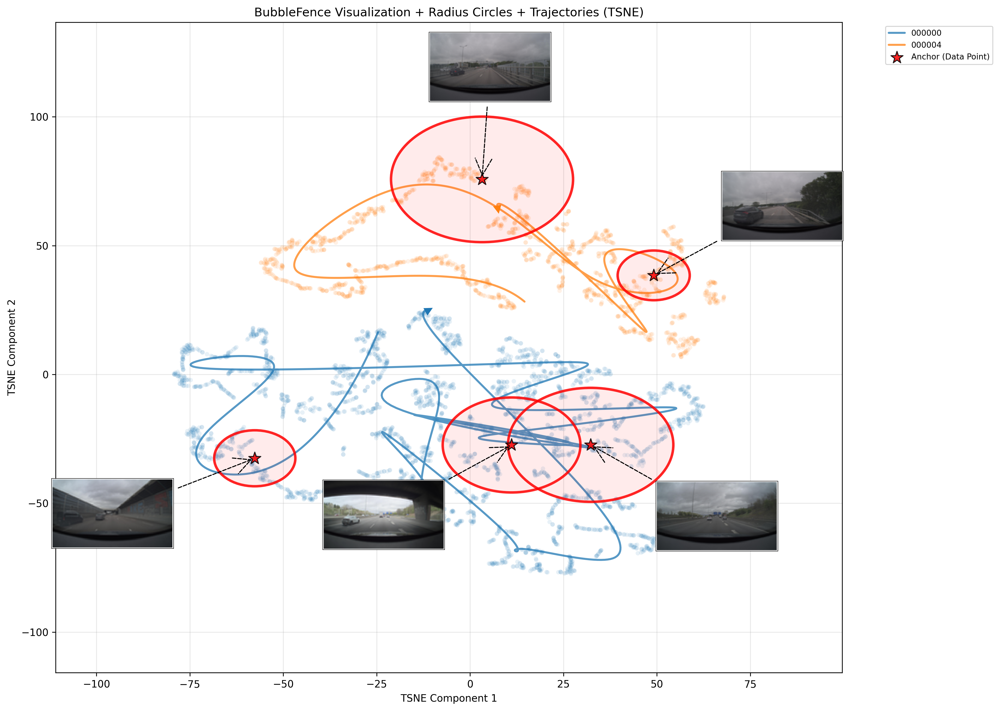

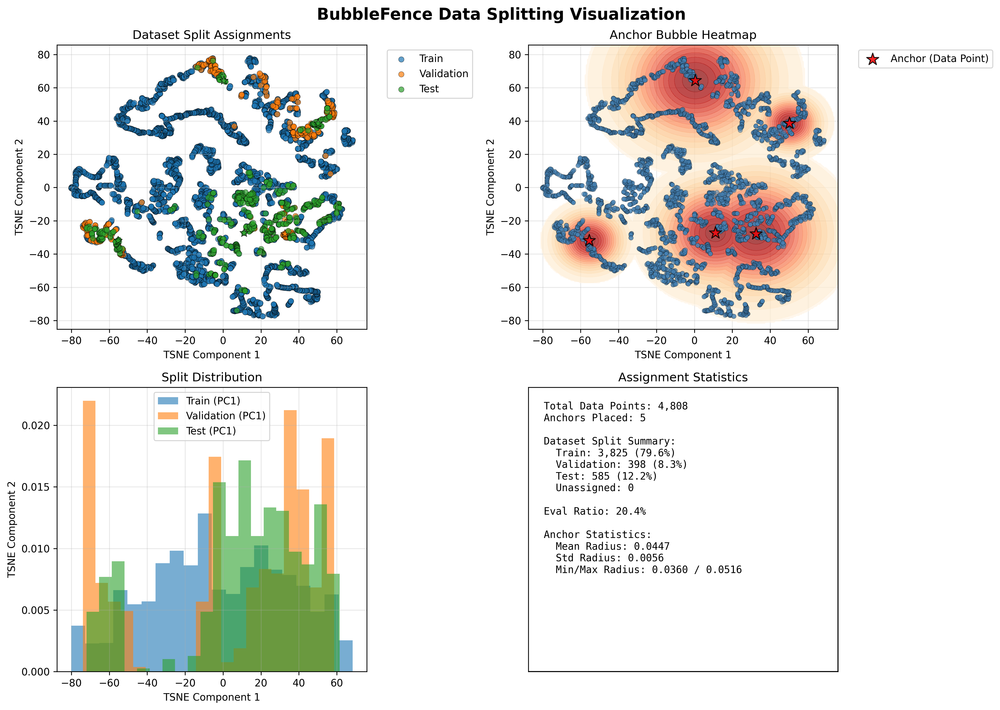

In [13]:
for vis in VIS:
    display(IPImage(f"{OUTPUT_DIR}/{vis['save']}", width=900))

## Round 2: Incremental ingestion with persistent anchors

BubbleFence is designed for continual curation -- new data streams in over time
and the split structure grows with it. Anchors from Round 1 are loaded from
`anchors_state.pkl` automatically. Incoming frames that fall inside existing
bubbles are assigned instantly; new anchors are only placed if the eval ratio
drops below target. This is the streaming persistence mechanism at work.

In [14]:
FOLDERS_R2 = [
    "zod_data/drives/000008/camera_front_blur",
    "zod_data/drives/000010/camera_front_blur",
    "zod_data/drives/000013/camera_front_blur",
]

for folder in FOLDERS_R2:
    print(f"\n=== {folder} ===")
    run_folder(folder, OUTPUT_DIR, config)


=== zod_data/drives/000008/camera_front_blur ===

=== zod_data/drives/000010/camera_front_blur ===

=== zod_data/drives/000013/camera_front_blur ===


In [15]:
full_df = pd.read_csv(os.path.join(OUTPUT_DIR, "full_dataset.csv"))

print(f"Total images: {len(full_df)}")
print(f"Unique runs:  {full_df['run_id'].nunique()}\n")

for split, count in full_df["train_split"].value_counts().items():
    print(f"  {split:6s}: {count:5d} ({count / len(full_df) * 100:.1f}%)")

Total images: 10758
Unique runs:  5

  train :  8596 (79.9%)
  val   :  1118 (10.4%)
  test  :  1044 (9.7%)


## Visualization (Round 2)

Same plots as Round 1, now showing all 5 drives. Notice how the trajectory
plot grows -- new bubbles appear only where needed, while existing bubbles
absorb nearby frames from the new drives.

In [16]:
VIS_R2 = [
    # Trajectory + circles + anchor thumbnails
    {"type": "standalone", "save": "tsne_large_traj_circles_thumbs_s100.png",
     "show_heatmap": False, "show_points": True,
     "show_trajectories": True, "show_radius_circles": True,
     "show_anchor_thumbnails": True, "num_anchor_thumbnails": 5,
     "smoothing": 100, "reduction_method": "TSNE" , "anchor_thumb_pixels": 120, 
     "point_alpha": 0.05},
      # Detailed 4-way with heatmaps
    {"type": "detailed", "save": "tsne_large_detailed_heatmap.png",
     "show_heatmap": True, "reduction_method": "TSNE"}
]

run_visualizations(OUTPUT_DIR, VIS_R2)

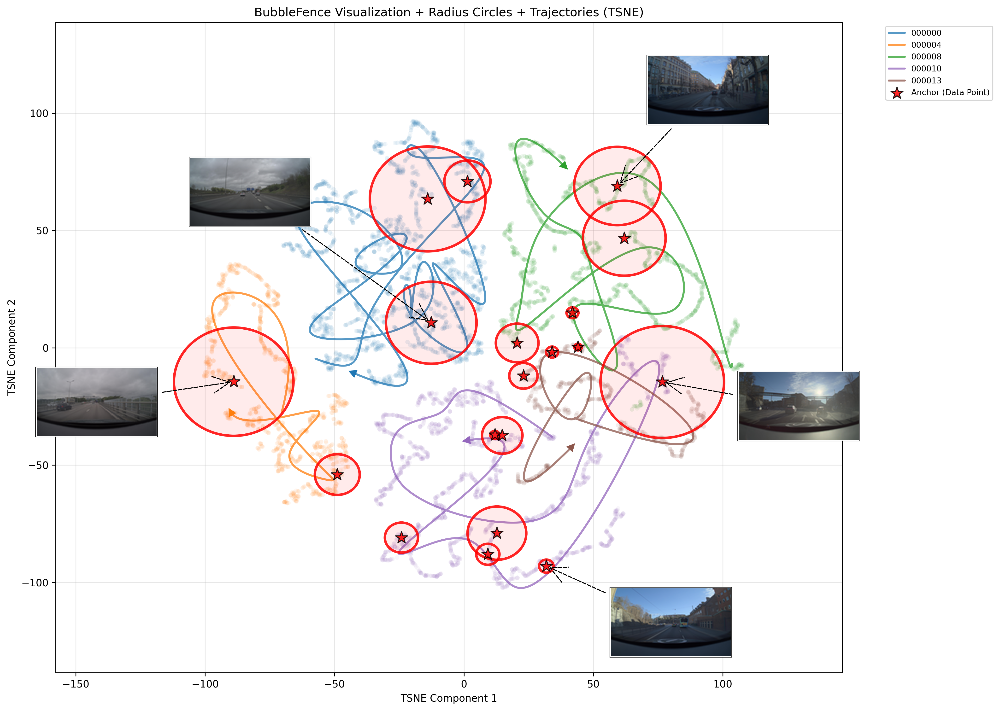

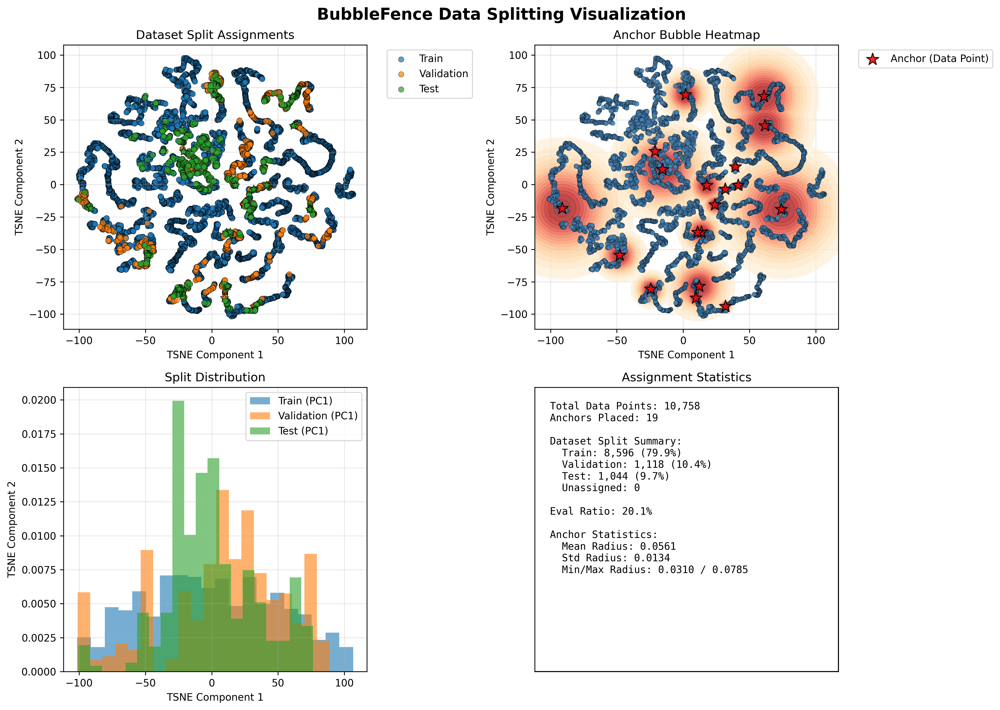

In [17]:
for vis in VIS_R2:
    display(IPImage(f"{OUTPUT_DIR}/{vis['save']}", width=900))